# COCO Dataset

In [1]:
import sys
sys.path.append('../')

%load_ext autoreload
%autoreload 2

from ssd_data import augmentations
from text_data import datasets, target_transforms, transforms

In [2]:
augmentation = None

transform = transforms.Compose(
    [transforms.ToTensor(),
     #transforms.Normalize(rgb_means=(0.485, 0.456, 0.406), rgb_stds=(0.229, 0.224, 0.225))]
    ]
)
target_transform = target_transforms.Compose(
    [target_transforms.Corners2Centroids(),
     target_transforms.ToQuadrilateral(),
     target_transforms.ToTensor()]
)
train_dataset = datasets.COCO2014Text_Dataset(ignore=target_transforms.Ignore(illegible=False), transform=transform, target_transform=target_transform, augmentation=None)


loading annotations into memory...
0:00:01.047707
creating index...
index created!


In [3]:
from ssd.core.boxes import centroids2corners
#from ssd.core.inference import toVisualizeRectangleRGBimg
from textboxespp.core.inference import toVisualizeQuadsRGBimg, toVisualizeRectangleRGBimg

%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import cv2, torch

# yellow rectangle is minimum bbox, red one is quadrilateral bbox

['14']


<IPython.core.display.Javascript object>


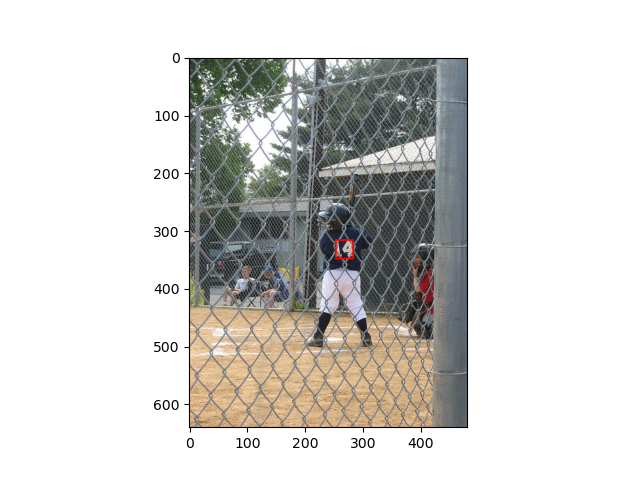

['', '', '', '', 'SONY', '', '300']


<IPython.core.display.Javascript object>


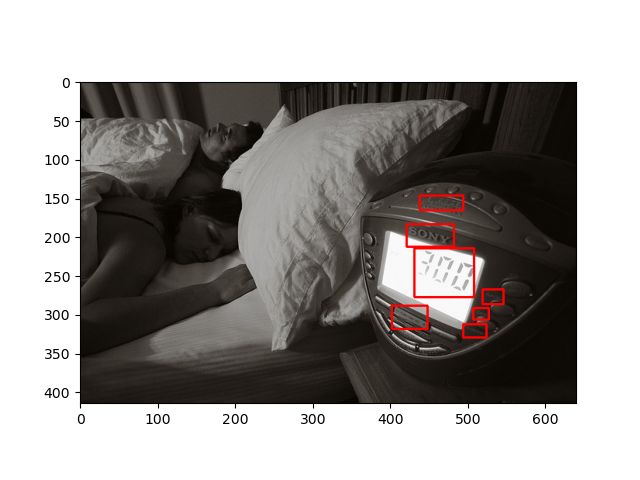

['']


<IPython.core.display.Javascript object>


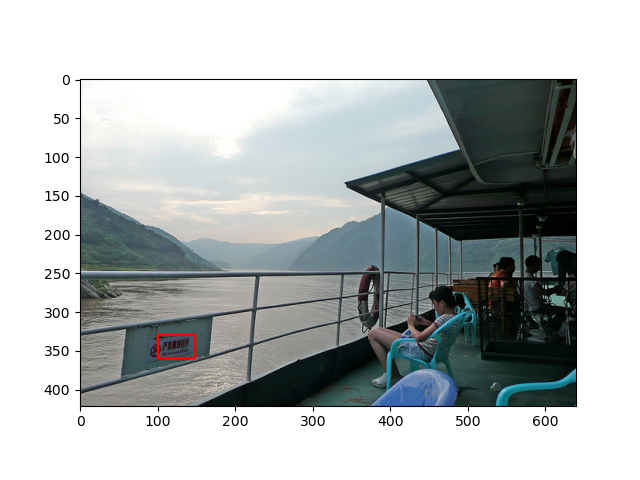

['kosher', 'tm', 'R', 'DONUTS', 'GREENBUSH', 'bakery']


<IPython.core.display.Javascript object>


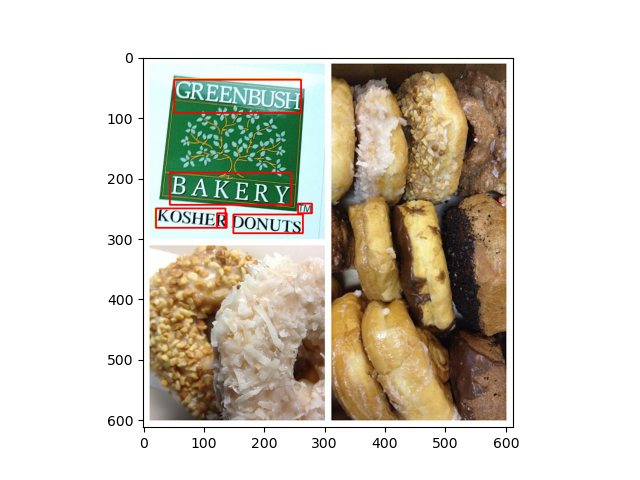

['PRODUCE', 'ALL', '', 'GREEN', 'Atole']


<IPython.core.display.Javascript object>


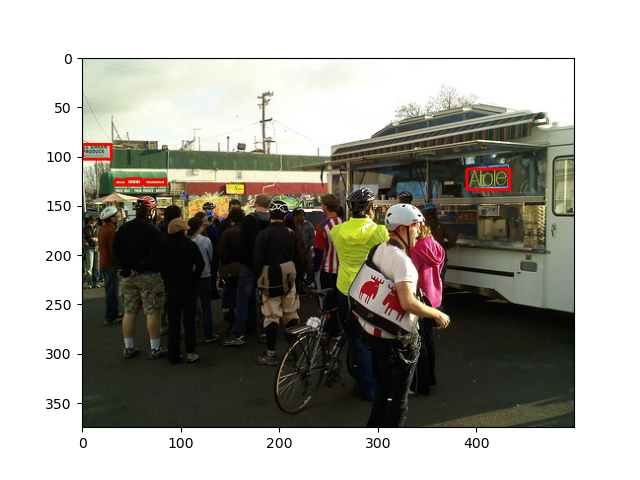

['EB']


<IPython.core.display.Javascript object>


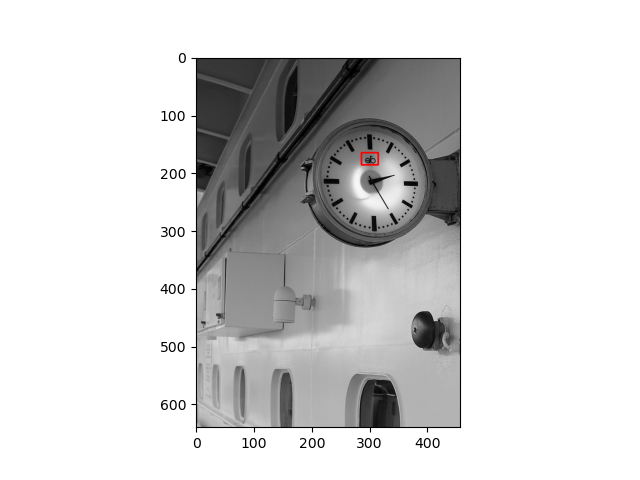

['25', 'speed', '', 'limit']


<IPython.core.display.Javascript object>


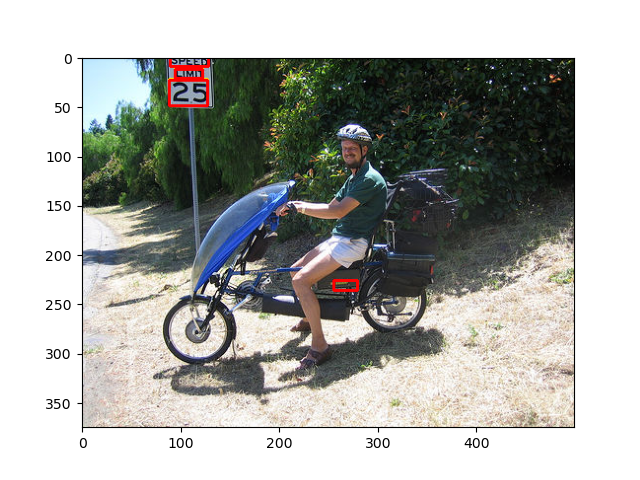

['', 'OAENC', 'Cnop']


<IPython.core.display.Javascript object>


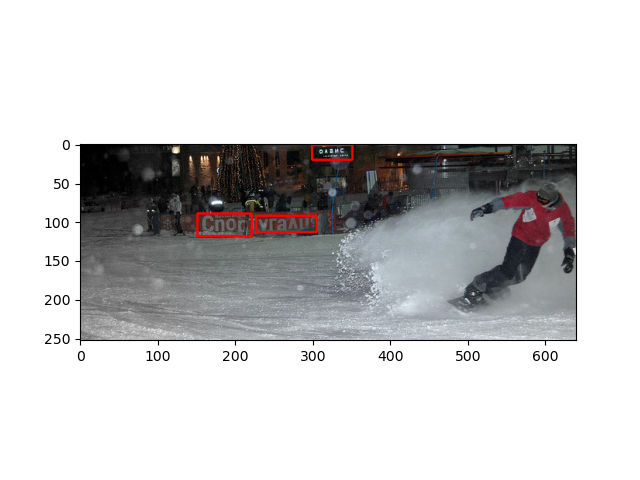

['hickop', '400']


<IPython.core.display.Javascript object>


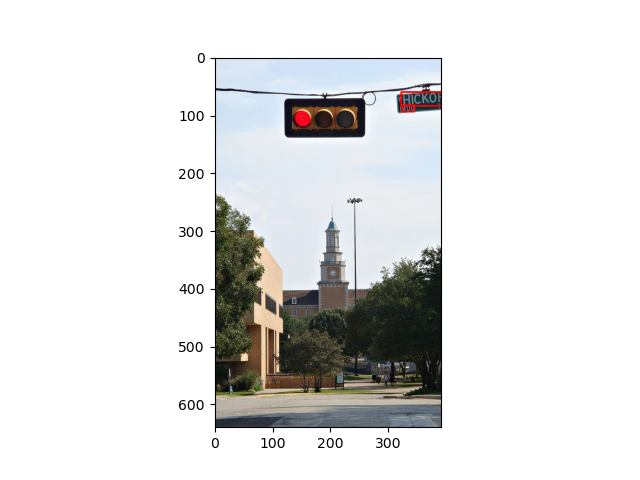

['QuickSiLveR', 'PRO', 'DELARSILLE', 'C', '2012FRANCE']


<IPython.core.display.Javascript object>


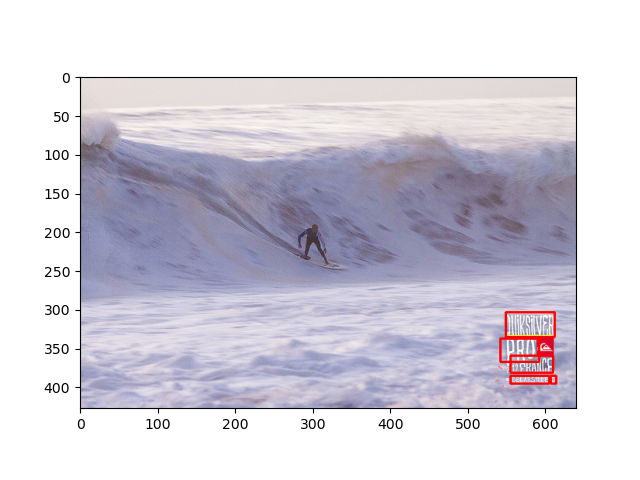

['SANDERS', 'TRACEY', '2012', 'C']


<IPython.core.display.Javascript object>


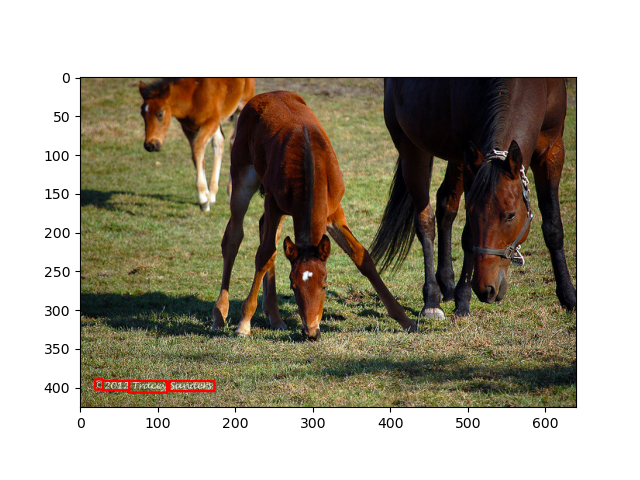

['police', '', '']


<IPython.core.display.Javascript object>


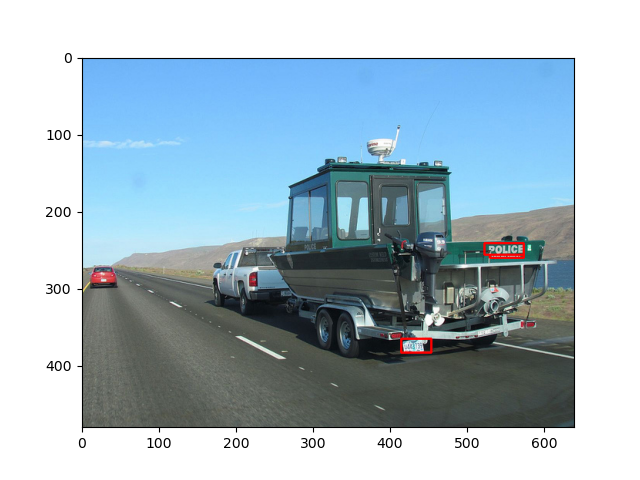

['Bar', 'pylsur ', 'beztu ']


<IPython.core.display.Javascript object>


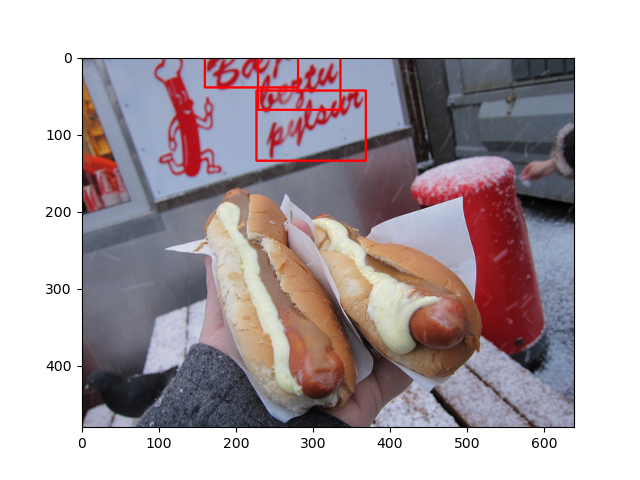

['OZU', '', '', '']


<IPython.core.display.Javascript object>


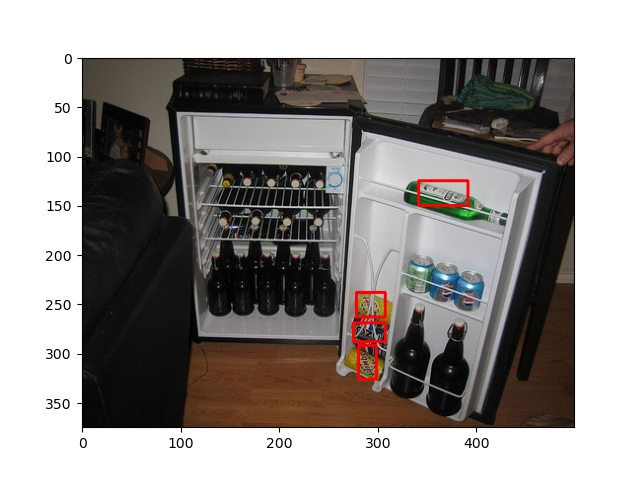

['Bonn', 'Information', 'Rhein-Promenade', 'Rathaus', 'm', '50', 'm', '', '', 'm', '', '', 'Munster', 'Behinderten-WC', 'Beethoven-Denkmal', 'Munsterplatz', 'beethoven-haus', '950m', 'Altes', '50m', 'Information', 'Bonn', '', '50', 'bonn', 'Munster', '100M', '600', '450', '100']


<IPython.core.display.Javascript object>


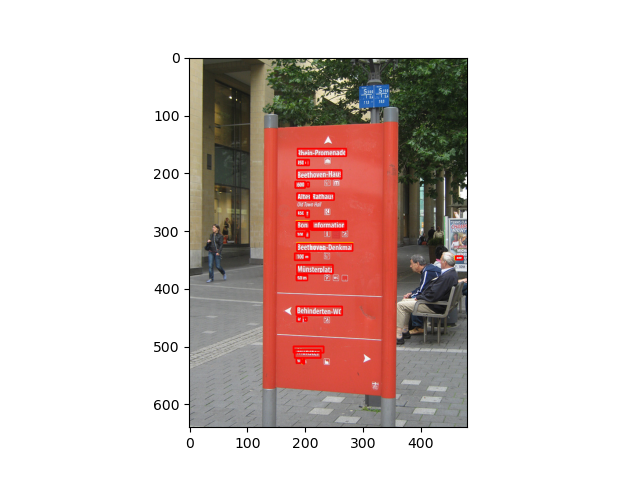

In [4]:
indices = np.random.randint(0, len(train_dataset), 15)

for index in indices:
    img, targets, texts = train_dataset[index]
    
    locs, quads = targets[:, :4], targets[:, 4:12]
    
    print(texts)
    
    img = toVisualizeRectangleRGBimg(img, locs, rgb=(255,255,0), verbose=False)# yellow
    img = toVisualizeQuadsRGBimg(torch.from_numpy(img.transpose((2, 0, 1)) / 255.), quads, verbose=False)# red

    plt.figure()
    plt.imshow(img)

# SynthText

In [5]:
target_transform = target_transforms.Compose(
    [target_transforms.Corners2Centroids(),
     #target_transforms.ToQuadrilateral(),
     target_transforms.ToTensor()]
)
train_dataset = datasets.SynthTextDataset(ignore=None, transform=transform, target_transform=target_transform, augmentation=None)

['players', 'had', 'awesome', 'uniformly', 'excellent.', 'Hall', 'Top', '10', 'total', 'career', 'and', 'and', 'the', 'help', 'research.', 'NASA', 'Marshall', 'Space', 'Huntsville,', 'AL', '35812', '(205)-453-0034', 'delivery', 'of', 'Solid', 'Rocket', 'MR.']
tensor([[0.5943, 0.0534, 0.1366, 0.0547],
        [0.7264, 0.0465, 0.0641, 0.0407],
        [0.8688, 0.0542, 0.1569, 0.0253],
        [0.5306, 0.1203, 0.1952, 0.0557],
        [0.7481, 0.1129, 0.1720, 0.0417],
        [0.9066, 0.1135, 0.0860, 0.0474],
        [0.5713, 0.1904, 0.0825, 0.0638],
        [0.6635, 0.1836, 0.0363, 0.0362],
        [0.7531, 0.1816, 0.0784, 0.0462],
        [0.8809, 0.1888, 0.1093, 0.0244],
        [0.2216, 0.5149, 0.0638, 0.0884],
        [0.1854, 0.5753, 0.0650, 0.0897],
        [0.7056, 0.6729, 0.1042, 0.0911],
        [0.1252, 0.9524, 0.1887, 0.1071],
        [0.7706, 0.3422, 0.1559, 0.0343],
        [0.6153, 0.3903, 0.1007, 0.0325],
        [0.7689, 0.3881, 0.1501, 0.0348],
        [0.9190, 0.3931, 0

<IPython.core.display.Javascript object>


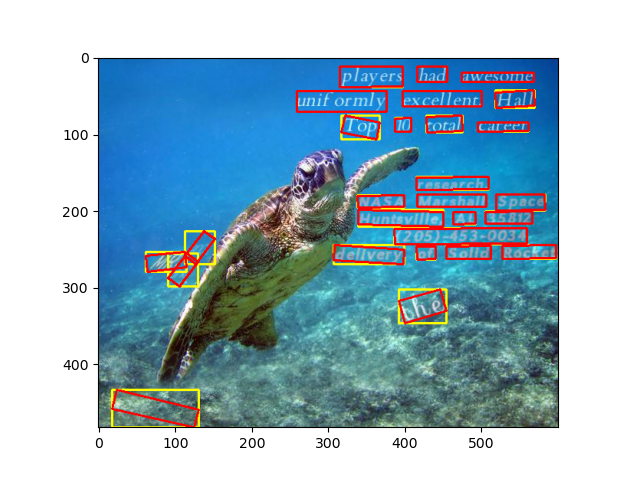

['Not', 'to', 'well', 'documented', 'between', 'Armenians', 'and', 'TIME.', 'are', 'not']
tensor([[0.5000, 0.8551, 0.0992, 0.0757],
        [0.5947, 0.8536, 0.0510, 0.0514],
        [0.1574, 0.8738, 0.0673, 0.0597],
        [0.3244, 0.8795, 0.2041, 0.0644],
        [0.0906, 0.9528, 0.1494, 0.0802],
        [0.2823, 0.9552, 0.1729, 0.0707],
        [0.4332, 0.9578, 0.0612, 0.0587],
        [0.3835, 0.4450, 0.1614, 0.0808],
        [0.4079, 0.1286, 0.0859, 0.0260],
        [0.5163, 0.1165, 0.0818, 0.0324]])


<IPython.core.display.Javascript object>


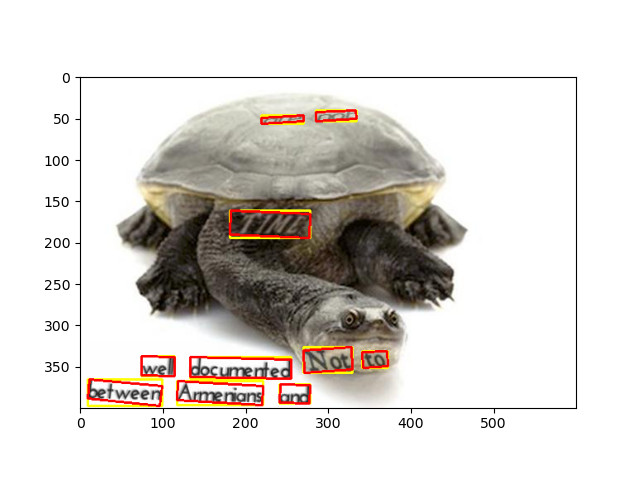

['Re:', '3-D', '>So', '>last', 'had', 'Texas']
tensor([[0.8534, 0.0976, 0.0845, 0.0987],
        [0.5319, 0.1056, 0.1108, 0.0888],
        [0.4208, 0.2381, 0.1052, 0.0891],
        [0.6398, 0.1089, 0.1024, 0.1018],
        [0.6597, 0.2614, 0.0881, 0.0932],
        [0.4470, 0.3107, 0.1181, 0.0936]])


<IPython.core.display.Javascript object>


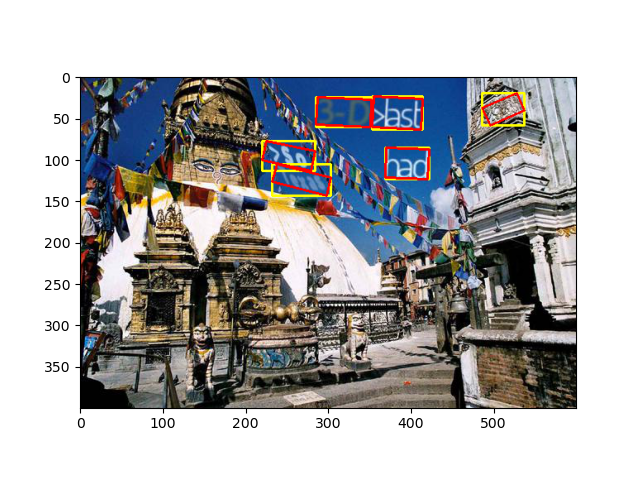

['The', 'also']
tensor([[0.8389, 0.0945, 0.1007, 0.1137],
        [0.5398, 0.5644, 0.1328, 0.1757]])


<IPython.core.display.Javascript object>


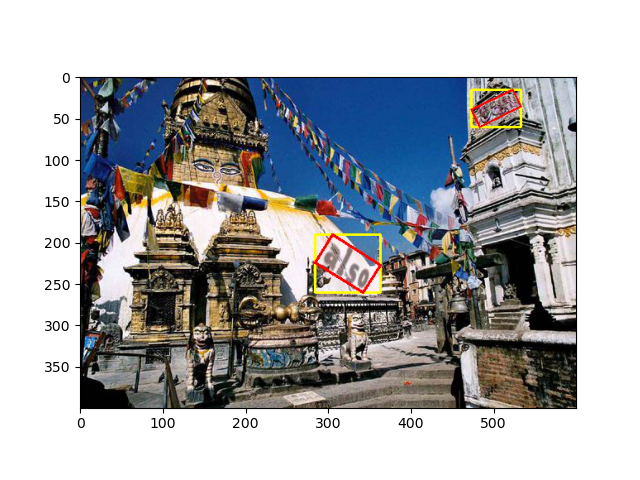

['the', 'from', 'and']
tensor([[0.3146, 0.6438, 0.0613, 0.0641],
        [0.0634, 0.8029, 0.1303, 0.0809],
        [0.0516, 0.8914, 0.1022, 0.0860]])


<IPython.core.display.Javascript object>


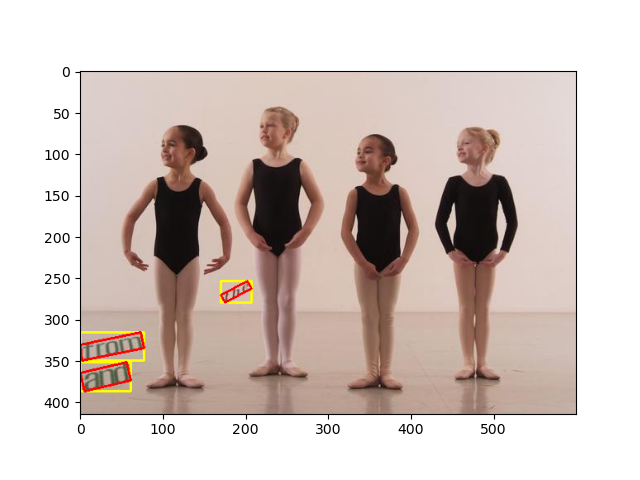

['their', 'Armenian', 'AAS:', 'back']
tensor([[0.9002, 0.8449, 0.1495, 0.0848],
        [0.4606, 0.5372, 0.2059, 0.1484],
        [0.1546, 0.0937, 0.1646, 0.0814],
        [0.9138, 0.7658, 0.1703, 0.1013]])


/home/kado/.pyenv/versions/anaconda3-2019.07/envs/textbox/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


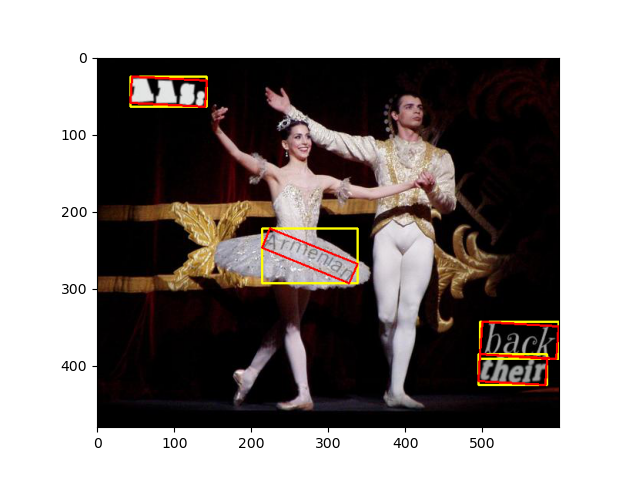

['you', 'similar', 'with', 'the', 'mail']
tensor([[0.1560, 0.2502, 0.1498, 0.1125],
        [0.1207, 0.9287, 0.2061, 0.1009],
        [0.3558, 0.1438, 0.1195, 0.1041],
        [0.2849, 0.3418, 0.1218, 0.0897],
        [0.3895, 0.2957, 0.0913, 0.0879]])


<IPython.core.display.Javascript object>


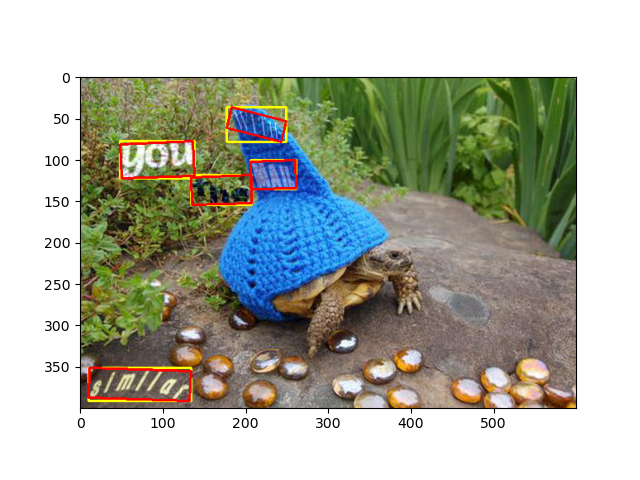

['the', 'Date:', 'for', "'wasted'", 'money.', 'for', 'they']
tensor([[0.1366, 0.5084, 0.1749, 0.1986],
        [0.4601, 0.4912, 0.1299, 0.1818],
        [0.0649, 0.6691, 0.0724, 0.0556],
        [0.6670, 0.0704, 0.1216, 0.0376],
        [0.8012, 0.0803, 0.1070, 0.0365],
        [0.4591, 0.5834, 0.1054, 0.1539],
        [0.6403, 0.8386, 0.1606, 0.1681]])


<IPython.core.display.Javascript object>


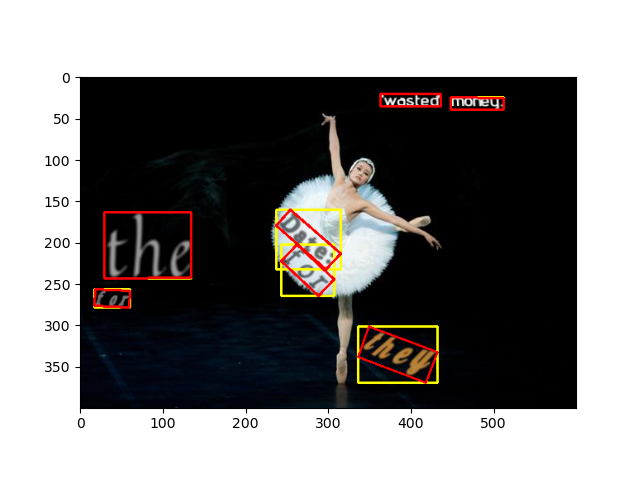

['-SG', 'Sounds', 'greatly']
tensor([[0.7912, 0.0517, 0.2331, 0.1313],
        [0.4399, 0.4596, 0.1419, 0.0688],
        [0.4645, 0.4374, 0.0945, 0.0375]])


<IPython.core.display.Javascript object>


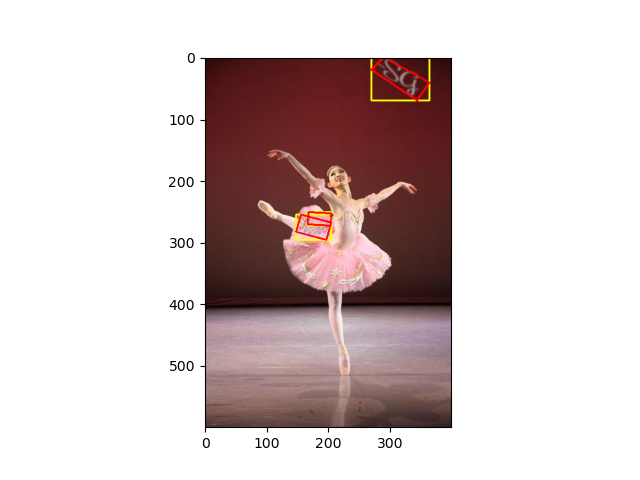

['768', 'those', 'from', 'it', 'Hope', 'and']
tensor([[0.8557, 0.2041, 0.1639, 0.1524],
        [0.1091, 0.0661, 0.1587, 0.0630],
        [0.1001, 0.1746, 0.1416, 0.0523],
        [0.2306, 0.1821, 0.0472, 0.0443],
        [0.8648, 0.3268, 0.1822, 0.1803],
        [0.0946, 0.2946, 0.1197, 0.0717]])


<IPython.core.display.Javascript object>


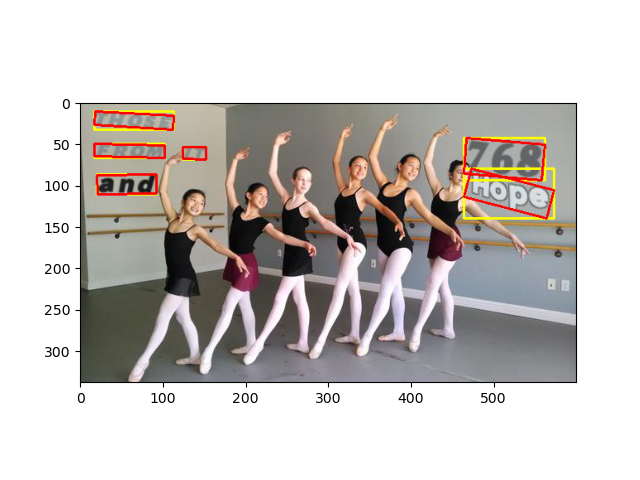

['but', 'the', 'Date:', '80%', 'Support', 'but', 'this', 'I', 'will']
tensor([[0.6755, 0.0383, 0.0742, 0.0556],
        [0.6629, 0.1400, 0.0814, 0.0568],
        [0.9291, 0.0539, 0.1271, 0.0548],
        [0.5247, 0.2555, 0.0810, 0.1110],
        [0.4727, 0.0646, 0.1833, 0.0977],
        [0.7138, 0.0931, 0.0826, 0.0508],
        [0.9042, 0.0993, 0.0745, 0.0397],
        [0.3999, 0.1244, 0.0170, 0.0634],
        [0.4642, 0.1302, 0.0870, 0.0839]])


<IPython.core.display.Javascript object>


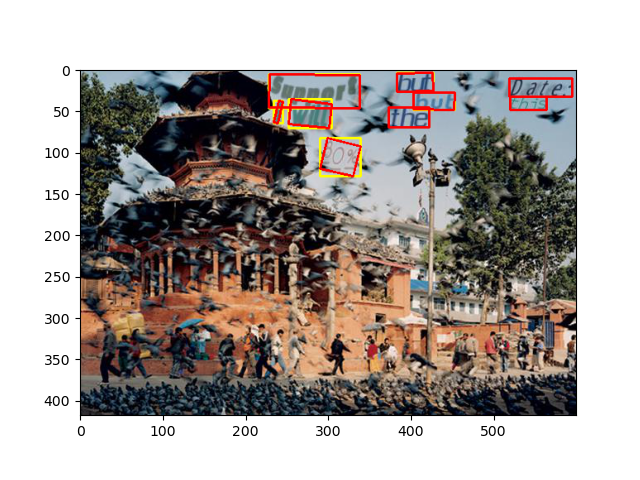

['the', 'Drew', 'out']
tensor([[0.9141, 0.0921, 0.1034, 0.0931],
        [0.5591, 0.0508, 0.0541, 0.0544],
        [0.6603, 0.3061, 0.0393, 0.0504]])


<IPython.core.display.Javascript object>


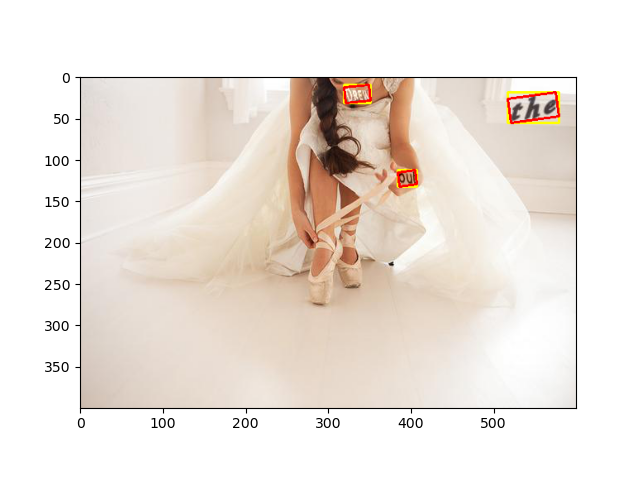

['Arno', 'other', 'Sound', '-Steve', '150']
tensor([[0.4123, 0.1877, 0.1510, 0.1286],
        [0.1842, 0.3583, 0.1418, 0.1124],
        [0.2222, 0.4447, 0.1496, 0.1031],
        [0.2579, 0.5295, 0.1389, 0.0727],
        [0.3904, 0.2799, 0.0653, 0.0727]])


<IPython.core.display.Javascript object>


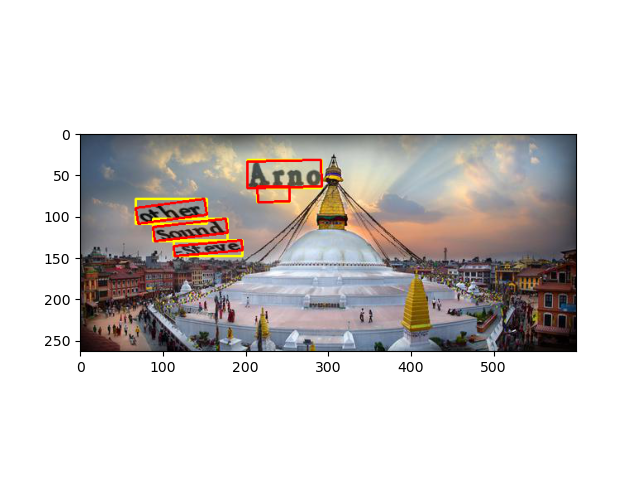

['Dr.', 'the', 'Any', 'for', 'that', '>his', 'not', 'case', 'with', 'for']
tensor([[0.1844, 0.8680, 0.1856, 0.2661],
        [0.5253, 0.6877, 0.1025, 0.0902],
        [0.6448, 0.8439, 0.0762, 0.0647],
        [0.6349, 0.9039, 0.0514, 0.0427],
        [0.7886, 0.9006, 0.0831, 0.0440],
        [0.0663, 0.7705, 0.1359, 0.1254],
        [0.6407, 0.8754, 0.0305, 0.0464],
        [0.6420, 0.9419, 0.0371, 0.0399],
        [0.7967, 0.9559, 0.0946, 0.0606],
        [0.3676, 0.9013, 0.0919, 0.0935]])


<IPython.core.display.Javascript object>


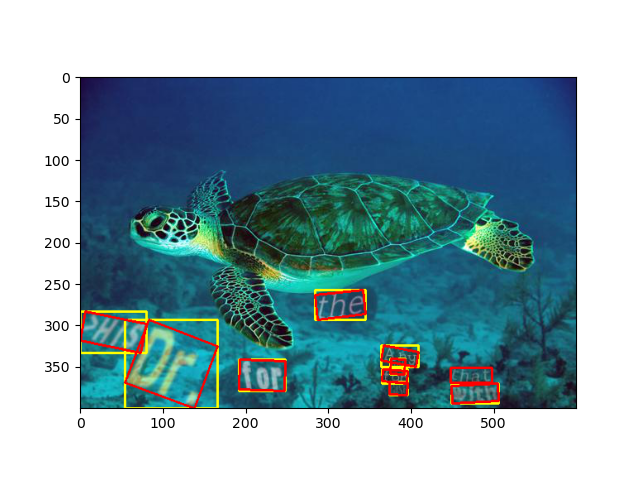

['To:', 'Cc:', 'use.', 'Has', 'and', 'way', 'have', 'for']
tensor([[0.6121, 0.4344, 0.0783, 0.0819],
        [0.6235, 0.5136, 0.0730, 0.0765],
        [0.9083, 0.0951, 0.0943, 0.0509],
        [0.9069, 0.1730, 0.0856, 0.0516],
        [0.9072, 0.2480, 0.0874, 0.0628],
        [0.9163, 0.3310, 0.0977, 0.0536],
        [0.5534, 0.0497, 0.0700, 0.0658],
        [0.6555, 0.3105, 0.0364, 0.0580]])


<IPython.core.display.Javascript object>


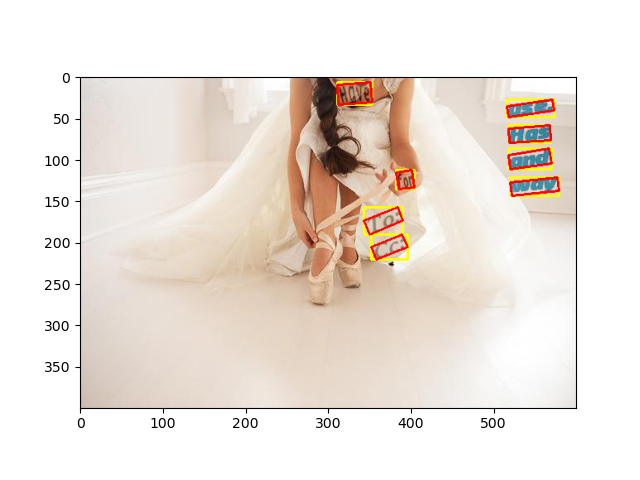

In [6]:
indices = np.random.randint(0, len(train_dataset), 15)

for index in indices:
    img, targets, texts = train_dataset[index]
    
    locs, quads = targets[:, :4], targets[:, 4:12]
    
    print(texts)
    print(locs)
    img = toVisualizeRectangleRGBimg(img, locs, rgb=(255,255,0), verbose=False)# yellow
    img = toVisualizeQuadsRGBimg(torch.from_numpy(img.transpose((2, 0, 1)) / 255.), quads, verbose=False)# red

    plt.figure()
    plt.imshow(img)